# <centered>  How was the data about biomedical tools collected and processed?</centered>
## Part 4: Research Papers published in *Nucleid Acids Research Oxford Academic Journal* during 2000-2017


In [1]:
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go
# Make plotly work with Jupyter notebook
init_notebook_mode()
import warnings
warnings.filterwarnings('ignore')

In [5]:
from IPython.display import Image
Image(url='pic/nar.jpg') 

In [4]:
import re
import numpy as np
import pandas as pd
from pandas import Series, DataFrame
tool_data=pd.read_table('ALL_DATA/NAR/TOOLS/nar_tools_00_17.txt', keep_default_na=False)
journal_data=pd.read_table('ALL_DATA/NAR/TXT/nar_00_17.txt', keep_default_na=False)
active_links_tools=pd.read_table('ALL_DATA/NAR/TOOLS/nar_active_links_00_17.txt', keep_default_na=False)
main_tools=pd.read_table('ALL_DATA/NAR/TOOLS/NAR_main_tools.txt', keep_default_na=False)

In [21]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

### STEP 1: Web Scraping
* Scrapy-Splash framework is used to extract **20,954** research papers from the journal.
* The data was collected on**10th July 2017**.
* All of the extracted articles were published during the period: **2009-2017**.

### STEP 2: Cleaning and data normalilzation

###  STEP 3: Regular  Expressions
* In order to establish which articles describe computational tools first the data in categories like Proceeding, Erratum are dropped, then a regular expression is used to find a name of a potential tool in the article's titile and the name is search for among the links gathered from the article's webpage.

* **3,627** articles are determined to describe softwares, tools or databases.


### STEP 4: Active links to homepages
* Each homepage associated with a bioinformatics tool is tested to determine if it is currently active.
* **2631** links to homepages are determined to be active.

### STEP 5: Unique tool's name
* Multiple journal articles can descripe the same tool -updates, new releases .
* There are **2029** unique tools in the journal- the newest article about a given tool is associated to it for futher analysis.

### STEP 6: Natural Language Processing-similarity
* NLTK -NLP Pyton library is used to analyze the abstracts of main articles. 
* Adjacency matrix is created to describe similarity between each pair of tools.
* t-SNE is used to create a visualization of relationships between the tools.

### STEP 7: Dataframes to SQL
* All the data is stored in rational database.

In [9]:
#len(journal_data)

In [10]:
#len(tool_data)

In [11]:
#len(active_links_tools)

In [12]:
#len(main_tools)

In [13]:
temp = pd.DataFrame({'tags':journal_data['tag'].value_counts()})
df = temp[temp.index != 'Unspecified']
df = df.sort_values(by='tags', ascending=True)
df=df[46:]

temp2 = pd.DataFrame({'tags':tool_data['tag'].value_counts()})
df2 = temp2[temp2.index != 'Unspecified']
df2 = df2.sort_values(by='tags', ascending=True)
df2=df2[26:]



traceA  = go.Bar(
              y = df.index,
              x = df.tags,
              orientation='h',
              name="All Articles",
              marker=dict(color='rgba(222,45,38,0.8)'))
traceB  = go.Bar(
              y = df2.index,
              x = df2.tags,
              name="Extracted Tools",
              orientation='h',
              marker=dict(color='rgb(107, 107, 107)'))

layout = go.Layout(
        height = '800',
        margin=go.Margin(l=250),
        barmode='grouped-bar',
        title = "Types of Tags in NAR Oxford Journal and Number of Tools Extracted from Each of Categories",
)
data = [traceA, traceB]
fig  = go.Figure(data=data, layout=layout)
iplot(fig)

### 20 tools with the most relative views among the extracted tools :

In [14]:
df3 = main_tools.sort_values(by='relative_views', ascending=False)
df_sample = df3[0:20]
data_sample=df_sample[["name_tool","relative_views", "citations_per_year", "homepage"]]
import plotly.figure_factory as ff
table = ff.create_table(data_sample)
iplot(table)

Relative view are calculated on a scale from 4 to 34 and are adjusted for time. The tool with score 34 is the most viewed in the journal. (These scale was used for visualization purposes).

# The information about the article altmetric score,  number of citations and amount of views among articles about bioinformatics tools with an active homepage. 

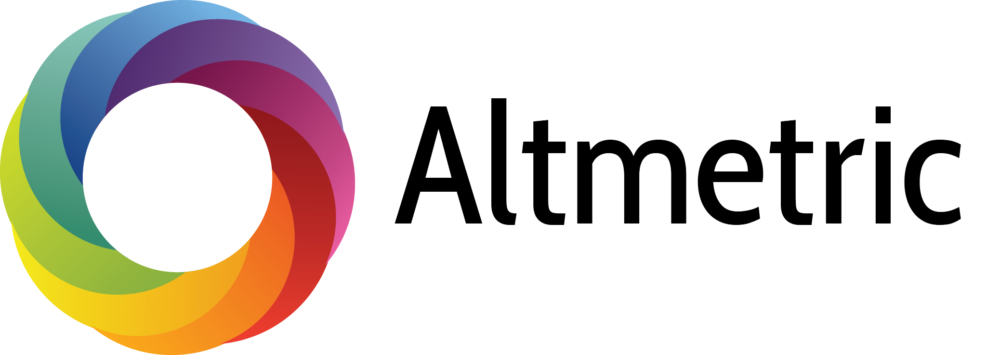

In [12]:
from IPython.display import Image
Image(filename='pic/alt.png', width=120, height=150)

In [15]:
temp5 = pd.DataFrame({'alt_score':active_links_tools['altmetric_score'].value_counts()})

trace5  = go.Bar(
              x= temp5.index,
              y=temp5.alt_score,
              name="Extracted Tools",
              marker=dict(color='rgb(57, 97, 173)',
              line=dict(
                    color='black',
                    width=1,)))

layout = go.Layout(
      title="Distribution of Altmetric Score Among the 'Extracted Tools'.",
     font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
         xaxis=dict(
        title='Altmetric Attention Score',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Number of Articles',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)
data = [trace5]

fig4  = go.Figure(data=data, layout=layout)
iplot(fig4)

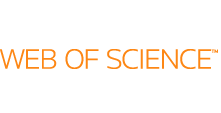

In [14]:
from IPython.display import Image
Image(filename='pic/web.png', width=120, height=150)

In [16]:
temp6=active_links_tools["citations_amount"]

trace5  = go.Histogram(
              x= temp6,
              name="Extracted Tools",
              autobinx=False,
              xbins=dict(
              start=0,
              end=180,
              size=2,
    ),
              marker=dict(color='rgb(128, 183, 145)',
              line=dict(
                    color='black',
                    width=1,)))

layout = go.Layout(
      title="Distribution of Citations Among the 'Extracted Tools'.",
     font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
         xaxis=dict(
        title='Number of citations',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Number of Articles',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)
data = [trace5]

fig4  = go.Figure(data=data, layout=layout)
iplot(fig4)

In [17]:
trace0 = go.Scattergl(
    x = active_links_tools.views,
    y = active_links_tools.altmetric_score,
    text=['<br>'.join([x,y]) for x,y in zip(active_links_tools.name_tool, active_links_tools.homepage)],
    mode = 'markers',
    marker = dict(
        size = 10,
        color = active_links_tools.citations_amount, #set color equal to a variable
        showscale=True,
        line = dict(
            width = 2,
            color = 'rgb(0, 0, 0)'
        )
    )
)

data = [trace0]

layout = dict(title = 'Altmetric Score,Views amd Citations Among the Active Extracted Tools',
              
     font=dict(family='Courier New, monospace', size=15, color='#686868'),
         xaxis=dict(
        title='Number of Views',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Altmetric Score',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

fig = dict(data=data, layout=layout)
iplot(fig)

The color scale represents the number of citations.
 Active - the homepage is currently active.

In [18]:
import plotly
plotly.offline.init_notebook_mode()
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.plotly as py
import plotly.graph_objs as go

import numpy as np

x_list = main_tools.x.tolist()
y_list = main_tools.y.tolist()
z_list = main_tools.z.tolist()
tool_name = main_tools.name_tool.tolist()

trace1 = go.Scatter3d(
    x=x_list,
    y=y_list,
    z=z_list,
    text=['<br>'.join([x,y]) for x,y in zip(main_tools.name_tool, main_tools.homepage)],
    mode='markers',
    hoverinfo="text", 
    marker=dict(
        size=main_tools.relative_views,
        symbol='circle',
        cmin=4,
        cmax=34,
        colorscale='Portland',
        color = main_tools.citations_per_year, #set color equal to a variable
        showscale=True,
        line=dict(
            width=1
        ),
        opacity=0.9
    )
)


data = [trace1]
layout = go.Layout(
    title = 'Similarity Map',
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
    xaxis=dict(
             showgrid=False,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        showgrid=False,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    
    
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)


* Size represents number of relative views.
* Color scale represents amount of citations per year.

In [19]:
# Create a trace
x_list_2d =  main_tools.x_2d.tolist()
y_list_2d =  main_tools.y_2d.tolist()
tool_name =  main_tools.name_tool.tolist()

trace0 = go.Scattergl(
    x = x_list_2d ,
    y = y_list_2d,
    text=tool_name,
    mode = 'markers',
    marker = dict(
        size =  main_tools.relative_views,
        color =  main_tools.citations_per_year, #set color equal to a variable
        showscale=True,
        line = dict(
            width = 2,
            color = 'rgb(0, 0, 0)'
        )
    )
)

data = [trace0]

layout = dict(title = 'Similarity Map',
              
     font=dict(family='Courier New, monospace', size=15, color='#686868'),
         xaxis=dict(
             showgrid=False,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        showgrid=False,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

fig = dict(data=data, layout=layout)
iplot(fig)

* Size represents number of relative views.
* Color scale represents amount of citations per year.

In [20]:
# Create a trace
x_list_2d = main_tools.x_2d.tolist()
y_list_2d = main_tools.y_2d.tolist()
tool_name = main_tools.name_tool.tolist()

trace = go.Scattergl(
    x = x_list_2d ,
    y = y_list_2d,
    text=tool_name,
    mode = 'markers'
    
)
layout = dict(title = 'Similarity Map Basic',
              
     font=dict(family='Courier New, monospace', size=15, color='#686868'),
         xaxis=dict(
             showgrid=False,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        showgrid=False,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

data = [trace]

fig = dict(data=data, layout=layout)
iplot(fig)

#             <centered>... SUMMARY FOR ALL OF THE JOURNALS ...</centered>

Name of the Journal |Articles Extracted|Number of 'Tool' Related Articles| Articles with Active Link| Unique Tools|Period
  ------------- |----------| ------|---|
BMC Bioinformatics |8,358 | 2,099|1,490|1,408|2000-2017
NAR Oxford |20,954| 3,627|2,631|2,029|2000-2017
Database Oxford |742|391| 333|300|2009-2017
Bioinformatics Oxford|10,681| 3,627|2,595|2,482|2000-2017
TOTAL:|40,735|9,744|7,049|?